In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 27.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 130.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 96.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 63.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 104.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

YOLOV8 ON ORIGINAL DATASET


0: 640x640 2 weeds, 204.2ms
1: 640x640 5 crops, 204.2ms
2: 640x640 1 weed, 204.2ms
3: 640x640 1 crop, 204.2ms
4: 640x640 1 weed, 204.2ms
5: 640x640 3 weeds, 204.2ms
6: 640x640 1 crop, 204.2ms
7: 640x640 1 crop, 204.2ms
8: 640x640 1 crop, 204.2ms
9: 640x640 25 crops, 204.2ms
10: 640x640 2 weeds, 204.2ms
11: 640x640 2 weeds, 204.2ms
12: 640x640 1 crop, 204.2ms
13: 640x640 2 weeds, 204.2ms
14: 640x640 1 weed, 204.2ms
15: 640x640 2 crops, 204.2ms
16: 640x640 1 crop, 204.2ms
17: 640x640 1 crop, 204.2ms
18: 640x640 3 weeds, 204.2ms
19: 640x640 1 weed, 204.2ms
Speed: 4.2ms preprocess, 204.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


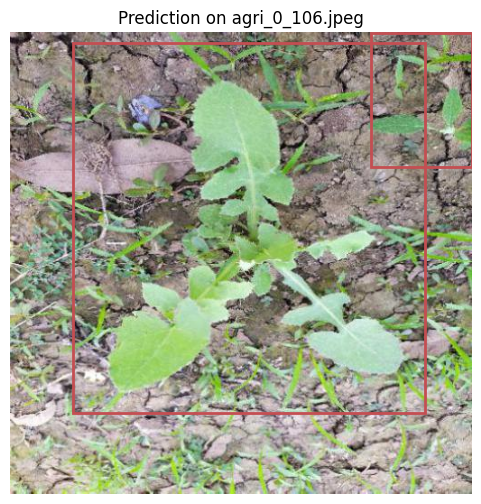

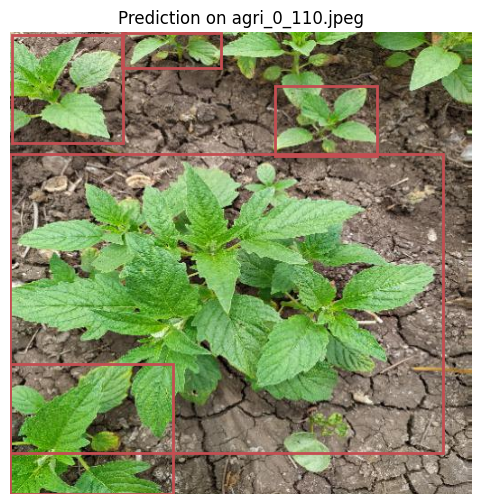

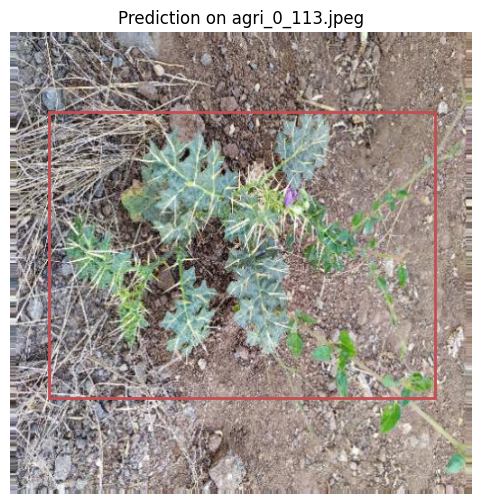

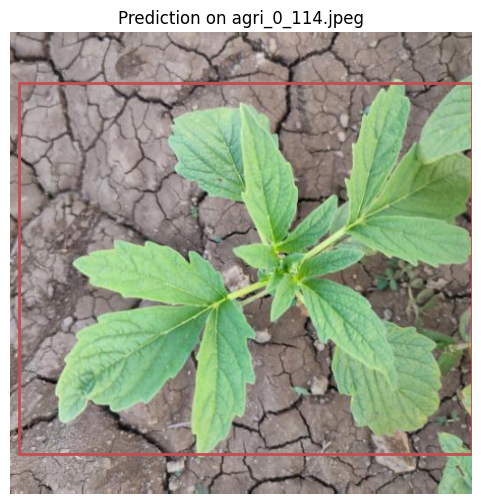

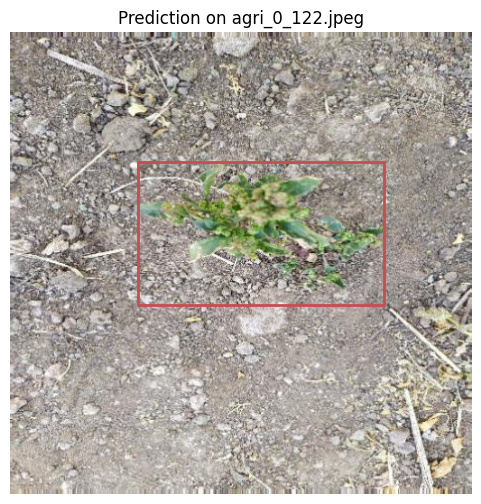

...

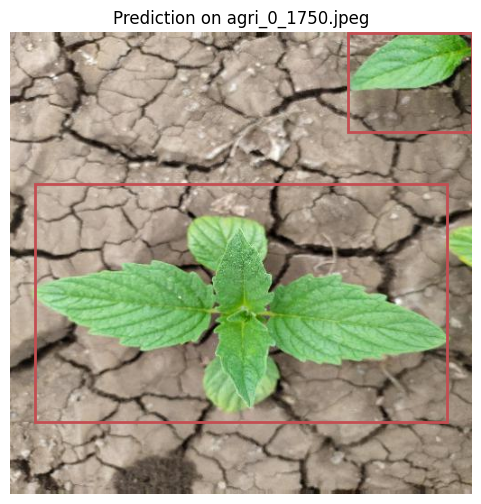

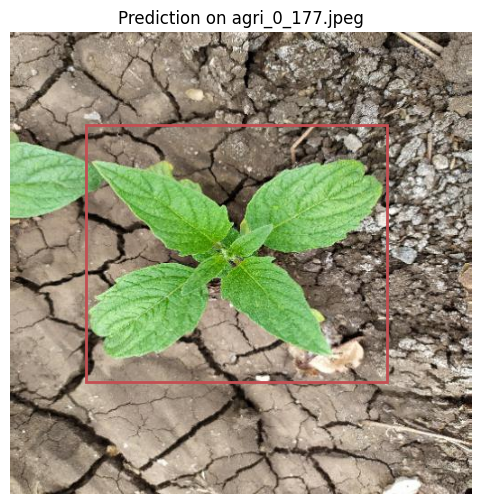

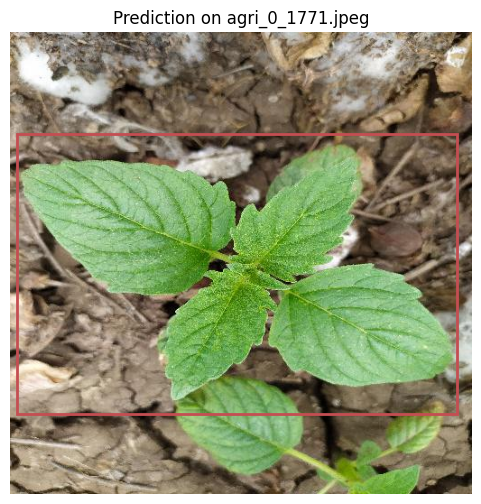

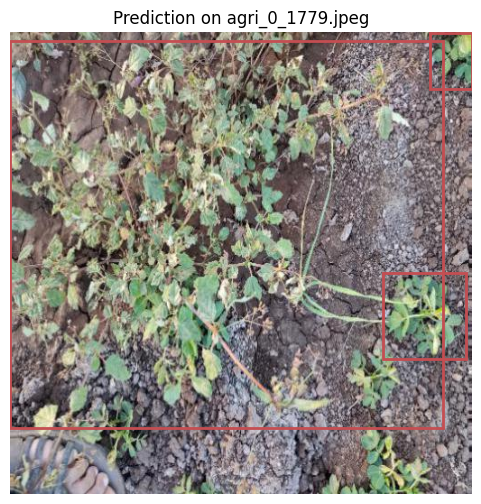

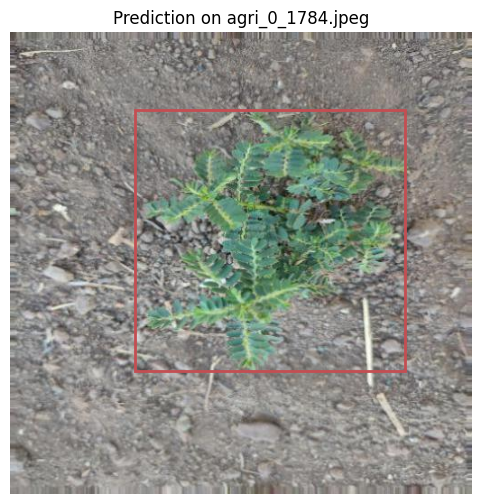

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import os

# Load the trained YOLOv8 model (replace with your actual model file path)
model = YOLO("/content/runs/detect/train/weights/best.pt")  # Replace with your model's path

# Path to the folder containing test images
img_dir = '/content/datasets/Train/images'

# Load the first 5 images
image_files = sorted(os.listdir(img_dir))[:20]
images = [cv2.imread(os.path.join(img_dir, f)) for f in image_files]

# Run YOLOv8 inference on these images
results = model([os.path.join(img_dir, f) for f in image_files])

# Process the results for each image and display bounding boxes
for i, result in enumerate(results):
    img = images[i]
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert to RGB for display
    ax = plt.gca()

    # Draw bounding boxes
    for box in result.boxes.xyxy.cpu().numpy():  # Extract the bounding boxes
        x1, y1, x2, y2 = box
        ax.add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                   linewidth=2, edgecolor='r', facecolor='none'))

    plt.title(f"Prediction on {image_files[i]}")
    plt.axis('off')
    plt.show()


In [ ]:
# Install YOLOv8
!pip install -q ultralytics

# Import
from ultralytics import YOLO
import torch

# Device
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Load small model (yolov8n is much lighter than yolov8x)
model = YOLO('yolov8n.pt')

# Train model with fewer epochs, smaller image size, smaller batch
model.train(
    data='/content/data.yaml',   # Make sure this path is correct
    epochs=30,                   # Reduce to 10 epochs for quick testing
    imgsz=640,                   # Smaller image size for faster training
    batch=16,                     # Smaller batch size for low memory usage
    device=device
)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 978.8/978.8 kB 45.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 104.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 82.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 67.4 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultr

100%|██████████| 6.25M/6.25M [00:00<00:00, 304MB/s]


Ultralytics 8.3.111 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format

100%|██████████| 755k/755k [00:00<00:00, 94.1MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/datasets/Train/labels... 220 images, 0 backgrounds, 0 corrupt: 100%|██████████| 220/220 [00:00<00:00, 473.92it/s]

train: New cache created: /content/datasets/Train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 25.2±7.6 MB/s, size: 67.5 KB)


val: Scanning /content/datasets/val/labels... 46 images, 4 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<00:00, 704.88it/s]

val: New cache created: /content/datasets/val/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30         0G      1.557      3.115      1.878         53        640: 100%|██████████| 14/14 [03:10<00:00, 13.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:18<00:00,  9.06s/it]

                   all         50         71    0.00387       0.76      0.232      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30         0G      1.329      2.383      1.654         44        640: 100%|██████████| 14/14 [03:15<00:00, 13.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:19<00:00,  9.98s/it]

                   all         50         71    0.00359       0.76      0.205      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30         0G      1.298      2.048      1.639         41        640: 100%|██████████| 14/14 [03:07<00:00, 13.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.96s/it]

                   all         50         71      0.509      0.184      0.222      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30         0G       1.32      1.966      1.672         40        640: 100%|██████████| 14/14 [03:13<00:00, 13.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.95s/it]

                   all         50         71      0.458      0.389      0.397      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30         0G      1.321      1.831      1.621         41        640: 100%|██████████| 14/14 [03:05<00:00, 13.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:16<00:00,  8.15s/it]

                   all         50         71      0.341      0.382      0.358      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30         0G      1.351      1.807      1.599         55        640: 100%|██████████| 14/14 [03:03<00:00, 13.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.65s/it]

                   all         50         71      0.525      0.562      0.487      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30         0G      1.362      1.791       1.61         36        640: 100%|██████████| 14/14 [03:01<00:00, 12.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.73s/it]

                   all         50         71      0.588      0.518      0.565      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30         0G      1.368      1.734      1.631         38        640: 100%|██████████| 14/14 [03:02<00:00, 13.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:14<00:00,  7.37s/it]

                   all         50         71      0.598      0.467      0.487      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30         0G       1.39      1.685      1.664         35        640: 100%|██████████| 14/14 [03:00<00:00, 12.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:14<00:00,  7.44s/it]

                   all         50         71      0.301      0.496      0.357      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30         0G      1.276      1.586      1.587         35        640: 100%|██████████| 14/14 [02:57<00:00, 12.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.60s/it]

                   all         50         71      0.453      0.543      0.376      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30         0G      1.287      1.539      1.586         30        640: 100%|██████████| 14/14 [02:59<00:00, 12.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:14<00:00,  7.40s/it]

                   all         50         71      0.662      0.498      0.543      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30         0G      1.256      1.512      1.567         28        640: 100%|██████████| 14/14 [02:57<00:00, 12.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:14<00:00,  7.43s/it]

                   all         50         71      0.296      0.482      0.283     0.0951



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30         0G      1.288      1.504      1.589         39        640: 100%|██████████| 14/14 [03:01<00:00, 12.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:14<00:00,  7.50s/it]

                   all         50         71      0.351      0.581      0.407      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30         0G      1.295      1.539      1.557         52        640: 100%|██████████| 14/14 [03:00<00:00, 12.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:14<00:00,  7.32s/it]

                   all         50         71      0.526       0.54      0.495      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30         0G      1.255      1.418      1.582         39        640: 100%|██████████| 14/14 [02:59<00:00, 12.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:16<00:00,  8.01s/it]

                   all         50         71      0.773      0.637      0.674        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30         0G      1.266      1.441      1.538         59        640: 100%|██████████| 14/14 [03:02<00:00, 13.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.55s/it]

                   all         50         71       0.81      0.744      0.778      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30         0G      1.189      1.316      1.489         42        640: 100%|██████████| 14/14 [03:00<00:00, 12.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.51s/it]

                   all         50         71      0.801       0.69      0.749      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30         0G      1.235      1.322      1.486         45        640: 100%|██████████| 14/14 [03:00<00:00, 12.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.88s/it]

                   all         50         71      0.746      0.702      0.743       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30         0G      1.214      1.322      1.537         46        640: 100%|██████████| 14/14 [03:01<00:00, 12.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:16<00:00,  8.34s/it]

                   all         50         71      0.672      0.762      0.736      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30         0G      1.159      1.257      1.483         73        640: 100%|██████████| 14/14 [03:01<00:00, 12.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:16<00:00,  8.17s/it]

                   all         50         71      0.699      0.743      0.716      0.415


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30         0G      1.129      1.446      1.554         14        640: 100%|██████████| 14/14 [03:02<00:00, 13.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.97s/it]

                   all         50         71       0.79       0.65      0.704      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30         0G      1.119      1.379      1.545         35        640: 100%|██████████| 14/14 [03:01<00:00, 12.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.89s/it]

                   all         50         71      0.824      0.673      0.742      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30         0G       1.08      1.295      1.523         12        640: 100%|██████████| 14/14 [03:01<00:00, 12.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:16<00:00,  8.11s/it]

                   all         50         71      0.607      0.747      0.727      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30         0G      1.065       1.23      1.518         16        640: 100%|██████████| 14/14 [03:02<00:00, 13.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.65s/it]

                   all         50         71      0.729      0.748      0.754       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30         0G      1.038      1.214      1.483         21        640: 100%|██████████| 14/14 [03:02<00:00, 13.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.58s/it]

                   all         50         71      0.809      0.748      0.785      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30         0G      1.007      1.101      1.443         12        640: 100%|██████████| 14/14 [03:00<00:00, 12.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.70s/it]

                   all         50         71      0.798      0.762      0.792      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30         0G      1.029      1.156      1.459         38        640: 100%|██████████| 14/14 [03:04<00:00, 13.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.62s/it]

                   all         50         71      0.798       0.81      0.789      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30         0G     0.9734      1.072      1.426         13        640: 100%|██████████| 14/14 [03:03<00:00, 13.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.81s/it]

                   all         50         71      0.792      0.734      0.784      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30         0G     0.9515       1.05      1.395         17        640: 100%|██████████| 14/14 [03:03<00:00, 13.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.74s/it]

                   all         50         71      0.814      0.725      0.776      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30         0G      0.949      1.068      1.377         16        640: 100%|██████████| 14/14 [03:03<00:00, 13.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:15<00:00,  7.60s/it]

                   all         50         71       0.82      0.748      0.775      0.516



30 epochs completed in 1.658 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.111 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.84s/it]


                   all         50         71      0.793      0.734      0.784      0.525
                  crop         22         35      0.748      0.829      0.781      0.574
                  weed         24         36      0.837      0.639      0.787      0.476
Speed: 3.9ms preprocess, 257.6ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c1694cab610>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804


image 1/1 /content/agri_0_2595.jpeg: 640x640 3 weeds, 459.2ms
Speed: 6.6ms preprocess, 459.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


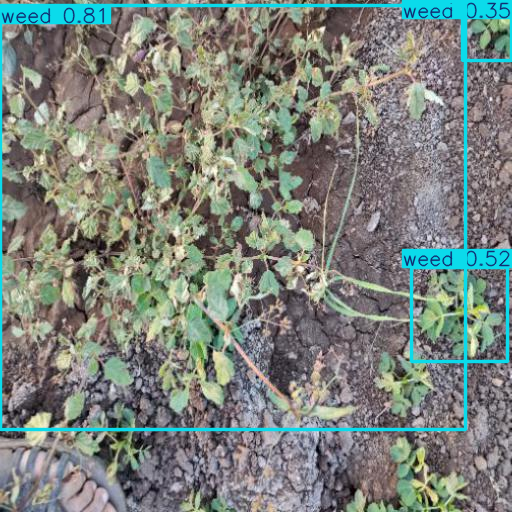

'/content/output_image.jpg'

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2

# Load your trained YOLOv8 model (update path if needed)
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Path to your test image
image_path = "/content/agri_0_2595.jpeg"  # replace with your actual image path

# Run inference
results = model(image_path)

# Automatically display image with bounding boxes (YOLO does this)
results[0].show()

# (Optional) Save result to file
results[0].save(filename="/content/output_image.jpg")



image 1/1 /content/agri_0_1114.jpeg: 640x640 1 weed, 221.4ms
Speed: 5.2ms preprocess, 221.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


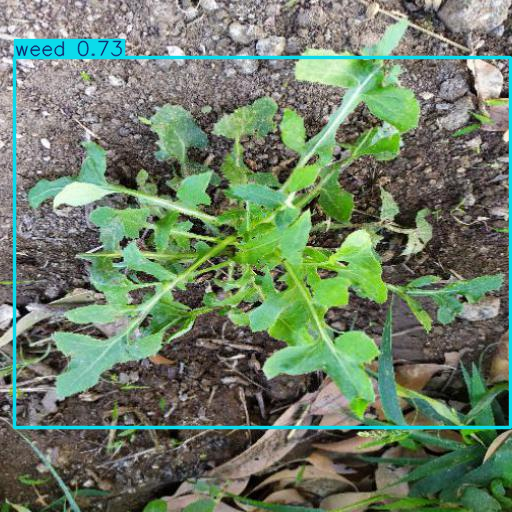

'/content/output_image.jpg'

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2

# Load your trained YOLOv8 model (update path if needed)
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Path to your test image
image_path = "/content/agri_0_1114.jpeg"  # replace with your actual image path

# Run inference
results = model(image_path)

# Automatically display image with bounding boxes (YOLO does this)
results[0].show()

# (Optional) Save result to file
results[0].save(filename="/content/output_image.jpg")



image 1/1 /content/agri_0_830.jpeg: 640x640 1 crop, 386.8ms
Speed: 9.4ms preprocess, 386.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


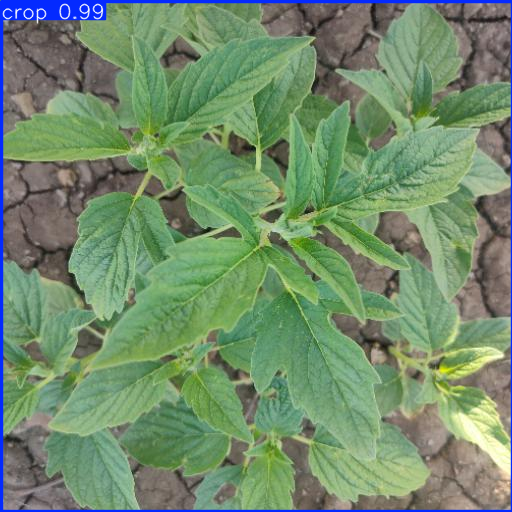

'/content/output_image.jpg'

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2

# Load your trained YOLOv8 model (update path if needed)
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Path to your test image
image_path = "/content/agri_0_830.jpeg"  # replace with your actual image path

# Run inference
results = model(image_path)

# Automatically display image with bounding boxes (YOLO does this)
results[0].show()

# (Optional) Save result to file
results[0].save(filename="/content/output_image.jpg")



image 1/1 /content/datasets/val/images/agri_0_1211.jpeg: 640x640 1 crop, 380.6ms
Speed: 6.3ms preprocess, 380.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


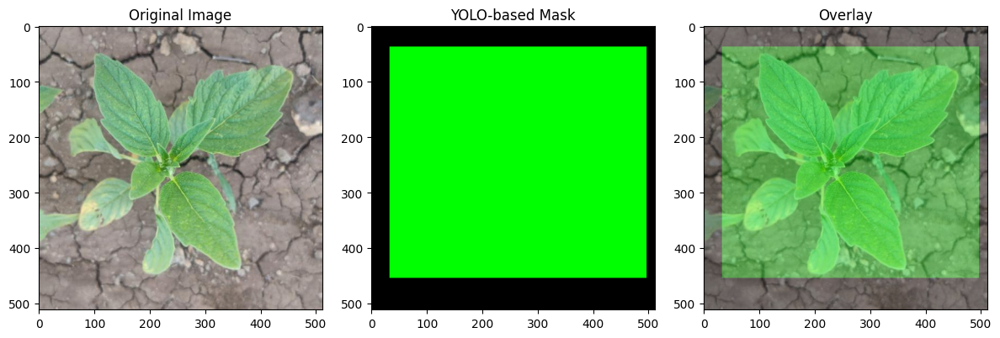

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Load YOLOv8 model and image
model = YOLO("/content/runs/detect/train/weights/best.pt")  # Replace with your trained model
img_path = "/content/datasets/val/images/agri_0_1211.jpeg"
image = cv2.imread(img_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
height, width, _ = image.shape

# Inference
results = model(img_path)[0]

# Create blank segmentation mask
seg_mask = np.zeros((height, width, 3), dtype=np.uint8)

# Loop through detections
for box in results.boxes:
    cls_id = int(box.cls[0].item())
    x1, y1, x2, y2 = map(int, box.xyxy[0])

    # Assign color based on class
    if cls_id == 0:  # assuming 0 = crop
        color = (0, 255, 0)  # Green
    elif cls_id == 1:  # assuming 1 = weed
        color = (255, 0, 0)  # Red (BGR)
    else:
        color = (0, 0, 255)  # Blue for others

    # Fill the mask area with color
    seg_mask[y1:y2, x1:x2] = color

# Overlay mask on original image
overlay = cv2.addWeighted(image_rgb, 0.7, seg_mask, 0.3, 0)

# Plot
plt.figure(figsize=(12, 5))
plt.subplot(1, 3, 1)
plt.imshow(image_rgb)
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(seg_mask)
plt.title("YOLO-based Mask")

plt.subplot(1, 3, 3)
plt.imshow(overlay)
plt.title("Overlay")

plt.tight_layout()
plt.show()


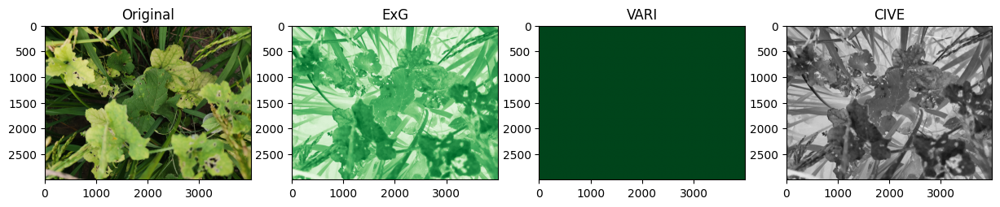

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load your RGB image
img_path = "/content/IMG_20220920_123248.jpg"  # update with your image
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Split channels
R = img_rgb[:, :, 0].astype('float32')
G = img_rgb[:, :, 1].astype('float32')
B = img_rgb[:, :, 2].astype('float32')

# 1. Excess Green (ExG)
exg = 2 * G - R - B

# 2. VARI
vari = (G - R) / (G + R - B + 1e-6)

# 3. CIVE
cive = 0.441 * R - 0.811 * G + 0.385 * B + 18.787

# Plot results
plt.figure(figsize=(15, 4))
plt.subplot(1, 4, 1)
plt.imshow(img_rgb)
plt.title("Original")

plt.subplot(1, 4, 2)
plt.imshow(exg, cmap='Greens')
plt.title("ExG")

plt.subplot(1, 4, 3)
plt.imshow(vari, cmap='Greens')
plt.title("VARI")

plt.subplot(1, 4, 4)
plt.imshow(cive, cmap='gray')
plt.title("CIVE")
plt.show()


In [ ]:
!pip install opencv-python Pillow numpy imgaug


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 948.0/948.0 kB 18.2 MB/s eta 0:00:00


In [ ]:
!pip install numpy==1.24.3


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 89.2 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.24.3 which is incompatible.
jax 0.5.2 requires numpy>=1.25, but you have numpy 1.24.3 which is incompatible.
blosc2 3.3.1 requires numpy>=1.26, but you have numpy 1.24.3 which is incompatible.
treescope 0.1.9 requires numpy>=1.25.2, but you have numpy 1.24.3 which is incompatible.
pymc 5.22.0 requires numpy>=1.25.0, but you have numpy 1.24.3 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 1.24.3 which is incompatible.
albumentations 2.0.5 requires numpy>=1.24.4, but you have numpy 1.24.3

In [ ]:
!pip install --upgrade imgaug

In [ ]:
augmenter = iaa.Sequential([
    iaa.Multiply((0.7, 1.3)),  # brightness
    iaa.LinearContrast((0.7, 1.3)),  # contrast
    iaa.AddToHueAndSaturation((-30, 30)),  # color shift
    iaa.Clouds(),  # simulate canopy shadows
    iaa.Fliplr(0.5),  # optional horizontal flip
    iaa.GaussianBlur(sigma=(0.0, 1.0)),  # soft blur
])


CANOPY AUGMENTATED

In [ ]:
# Install Albumentations (if not already installed)
!pip install albumentations --quiet

import os
import cv2
import shutil
import albumentations as A

# --- STEP 1: Define your dataset paths ---
input_image_dir = '/content/data/weeds/train/images'       # Update with your actual path
input_label_dir = '/content/data/weeds/train/labels'

output_image_dir = '/content/Augmented/images'
output_label_dir = '/content/Augmented/labels'

os.makedirs(output_image_dir, exist_ok=True)
os.makedirs(output_label_dir, exist_ok=True)

# --- STEP 2: Define canopy-style augmentations ---
transform = A.Compose([
    A.RandomBrightnessContrast(p=0.8),
    A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=40, val_shift_limit=30, p=0.8),
    A.RGBShift(r_shift_limit=20, g_shift_limit=30, b_shift_limit=20, p=0.5),
    A.RandomShadow(p=0.4),
    A.MotionBlur(p=0.3),
    A.HorizontalFlip(p=0.5),
])

# --- STEP 3: Loop through all images and apply augmentations ---
for filename in os.listdir(input_image_dir):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        img_path = os.path.join(input_image_dir, filename)
        label_path = os.path.join(input_label_dir, os.path.splitext(filename)[0] + '.txt')

        # Read image
        image = cv2.imread(img_path)

        for i in range(2):  # Two augmented versions per image
            augmented = transform(image=image)['image']
            new_img_name = os.path.splitext(filename)[0] + f'_aug{i}.jpg'
            new_label_name = os.path.splitext(filename)[0] + f'_aug{i}.txt'

            # Save augmented image
            cv2.imwrite(os.path.join(output_image_dir, new_img_name), augmented)

            # Copy corresponding label
            shutil.copy(label_path, os.path.join(output_label_dir, new_label_name))

print("✅ Augmentation complete. Augmented images and labels saved.")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 25.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.5 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.2.5 which is incompatible.


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.6' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


✅ Augmentation complete. Augmented images and labels saved.


In [ ]:
input_image_dir = '/contentdata/datasets/Train/images'
input_label_dir = '/contentdata/datasets/Train/labels'

output_image_dir = '/path/to/Augmented/images'
output_label_dir = '/path/to/Augmented/labels'

os.makedirs(output_image_dir, exist_ok=True)
os.makedirs(output_label_dir, exist_ok=True)


In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
import os
import shutil
import numpy as np

# --- STEP 1: Define dataset paths ---
input_image_dir = '/content/datasets/Train/images'  # Your actual path
input_label_dir = '/content/datasets/Train/labels'

output_image_dir = '/content/Augmentedtrainn/images'
output_label_dir = '/content/Augmentedtrainn/labels'

os.makedirs(output_image_dir, exist_ok=True)
os.makedirs(output_label_dir, exist_ok=True)

# --- STEP 2: Define the canopy-style augmentations ---
transform = A.Compose([
    A.RandomBrightnessContrast(p=0.8),
    A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=40, val_shift_limit=30, p=0.8),
    A.RGBShift(r_shift_limit=20, g_shift_limit=30, b_shift_limit=20, p=0.5),
    A.RandomShadow(p=0.4),
    A.MotionBlur(p=0.3),
    A.HorizontalFlip(p=0.5),
    A.RandomCrop(width=450, height=450, p=0.3),  # Random crop, if you want more diversity
], bbox_params=A.BboxParams(format='yolo', label_fields=['labels']))

# --- STEP 3: Loop through images, apply augmentations, and save ---
for filename in os.listdir(input_image_dir):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        img_path = os.path.join(input_image_dir, filename)
        label_path = os.path.join(input_label_dir, os.path.splitext(filename)[0] + '.txt')

        # Read image
        image = cv2.imread(img_path)

        # Read the label file for bounding boxes
        with open(label_path, 'r') as f:
            lines = f.readlines()

        bboxes = []
        labels = []
        for line in lines:
            parts = line.strip().split()
            label = int(parts[0])
            xmin, ymin, xmax, ymax = map(float, parts[1:])
            bboxes.append([xmin, ymin, xmax, ymax])
            labels.append(label)

        bboxes = np.array(bboxes)
        labels = np.array(labels)

        for i in range(2):  # Two augmented versions per image
            augmented = transform(image=image, bboxes=bboxes, labels=labels)

            augmented_image = augmented['image']
            new_img_name = os.path.splitext(filename)[0] + f'_aug{i}.jpg'
            new_label_name = os.path.splitext(filename)[0] + f'_aug{i}.txt'

            # Save augmented image
            cv2.imwrite(os.path.join(output_image_dir, new_img_name), augmented_image)

            # Write the new bounding boxes to the corresponding label file
            with open(os.path.join(output_label_dir, new_label_name), 'w') as f:
                for bbox, label in zip(augmented['bboxes'], augmented['labels']):
                    xmin, ymin, xmax, ymax = bbox
                    f.write(f"{label} {xmin} {ymin} {xmax} {ymax}\n")

print("✅ Augmentation complete. Augmented images and labels saved.")


✅ Augmentation complete. Augmented images and labels saved.


In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
import os
import shutil
import numpy as np

# --- STEP 1: Define dataset paths ---
input_image_dir = '/content/datasets/val/images'  # Your actual path
input_label_dir = '/content/datasets/val/labels'

output_image_dir = '/content/Augmentedval/images'
output_label_dir = '/content/Augmentedval/labels'

os.makedirs(output_image_dir, exist_ok=True)
os.makedirs(output_label_dir, exist_ok=True)

# --- STEP 2: Define the canopy-style augmentations ---
transform = A.Compose([
    A.RandomBrightnessContrast(p=0.8),
    A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=40, val_shift_limit=30, p=0.8),
    A.RGBShift(r_shift_limit=20, g_shift_limit=30, b_shift_limit=20, p=0.5),
    A.RandomShadow(p=0.4),
    A.MotionBlur(p=0.3),
    A.HorizontalFlip(p=0.5),
    A.RandomCrop(width=450, height=450, p=0.3),  # Random crop, if you want more diversity
], bbox_params=A.BboxParams(format='yolo', label_fields=['labels']))

# --- STEP 3: Loop through images, apply augmentations, and save ---
for filename in os.listdir(input_image_dir):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        img_path = os.path.join(input_image_dir, filename)
        label_path = os.path.join(input_label_dir, os.path.splitext(filename)[0] + '.txt')

        # Read image
        image = cv2.imread(img_path)

        # Read the label file for bounding boxes
        with open(label_path, 'r') as f:
            lines = f.readlines()

        bboxes = []
        labels = []
        for line in lines:
            parts = line.strip().split()
            label = int(parts[0])
            xmin, ymin, xmax, ymax = map(float, parts[1:])
            bboxes.append([xmin, ymin, xmax, ymax])
            labels.append(label)

        bboxes = np.array(bboxes)
        labels = np.array(labels)

        for i in range(2):  # Two augmented versions per image
            augmented = transform(image=image, bboxes=bboxes, labels=labels)

            augmented_image = augmented['image']
            new_img_name = os.path.splitext(filename)[0] + f'_aug{i}.jpg'
            new_label_name = os.path.splitext(filename)[0] + f'_aug{i}.txt'

            # Save augmented image
            cv2.imwrite(os.path.join(output_image_dir, new_img_name), augmented_image)

            # Write the new bounding boxes to the corresponding label file
            with open(os.path.join(output_label_dir, new_label_name), 'w') as f:
                for bbox, label in zip(augmented['bboxes'], augmented['labels']):
                    xmin, ymin, xmax, ymax = bbox
                    f.write(f"{label} {xmin} {ymin} {xmax} {ymax}\n")

print("✅ Augmentation complete. Augmented images and labels saved.")


✅ Augmentation complete. Augmented images and labels saved.


In [ ]:
import albumentations as A

transform = A.Compose([
    A.RandomBrightnessContrast(p=0.8),            # Adjust brightness and contrast
    A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=40, val_shift_limit=30, p=0.8),  # Adjust hue, saturation, and value
    A.RGBShift(r_shift_limit=20, g_shift_limit=30, b_shift_limit=20, p=0.5),  # RGB shift
    A.RandomShadow(p=0.4),                        # Add random shadow to simulate canopy reflection
    A.MotionBlur(p=0.3),                          # Simulate motion blur
    A.HorizontalFlip(p=0.5),                      # Random horizontal flip
])


In [ ]:
import yaml

data_yaml = {
    "path": "/content/datasets",  # base dataset directory
    "train": "/content/datasets/Train/images",
    "val": "/content/datasets/val/images",
    "nc": 2,
    "names": ["crop", "weed"]
}

# Save the YAML file
with open("data.yaml", "w") as f:
    yaml.dump(data_yaml, f, default_flow_style=False)

print("✅ data.yaml file created")


✅ data.yaml file created


In [ ]:
model_baseline = YOLO('yolov8n.pt')
model_baseline.train(
    data='/content/data.yaml',
    epochs=250,
    imgsz=640,
    batch=32,
    device=device
)


Ultralytics 8.3.124 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data.yaml, epochs=250, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, 

train: Scanning /content/datasets/Train/labels.cache... 220 images, 0 backgrounds, 0 corrupt: 100%|██████████| 220/220 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 546.4±55.8 MB/s, size: 67.5 KB)


val: Scanning /content/datasets/val/labels.cache... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<?, ?it/s]


Plotting labels to runs/detect/train4/labels.jpg... 


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b8341f49760>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7b8341f49760>  
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
     self._shutdown_workers()      
   File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
     ^if w.is_alive():^
^^^^^ ^^^ ^^^^ ^^^^^ ^^^^^^^^^

optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train4
Starting training for 250 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/250      4.51G       1.71      3.284      2.024         76        640: 100%|██████████| 7/7 [00:03<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

                   all         46         71    0.00396      0.773     0.0837     0.0391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/250      4.51G      1.419      2.996      1.772        105        640: 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

                   all         46         71    0.00472      0.829      0.253      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/250      4.51G      1.295      2.419      1.643         79        640: 100%|██████████| 7/7 [00:02<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]

                   all         46         71    0.00427       0.83      0.305      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/250      4.51G      1.264       1.99      1.604        110        640: 100%|██████████| 7/7 [00:02<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

                   all         46         71      0.948      0.123      0.433      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/250      4.51G      1.249      1.897       1.58        107        640: 100%|██████████| 7/7 [00:02<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]

                   all         46         71      0.726      0.471      0.537      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/250      4.51G      1.302      1.763      1.603         91        640: 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]

                   all         46         71        0.6      0.425      0.485      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/250      4.51G      1.292      1.718      1.598        118        640: 100%|██████████| 7/7 [00:03<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

                   all         46         71      0.458      0.379      0.406      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/250      4.51G      1.381      1.695       1.61         97        640: 100%|██████████| 7/7 [00:02<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

                   all         46         71      0.421      0.425      0.375      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/250      4.51G      1.351      1.641      1.568        101        640: 100%|██████████| 7/7 [00:02<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

                   all         46         71      0.508      0.425       0.41      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/250      4.51G      1.308       1.63      1.618         86        640: 100%|██████████| 7/7 [00:03<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]

                   all         46         71      0.562      0.507      0.549      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/250      4.51G      1.252      1.532      1.579         82        640: 100%|██████████| 7/7 [00:02<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

                   all         46         71      0.479       0.55      0.497      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/250      4.51G      1.289       1.54      1.554        101        640: 100%|██████████| 7/7 [00:02<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

                   all         46         71      0.694      0.566       0.65      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/250      4.51G      1.317      1.585      1.584         91        640: 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

                   all         46         71      0.577      0.541      0.556      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/250      4.51G       1.26      1.518      1.567         94        640: 100%|██████████| 7/7 [00:02<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]

                   all         46         71      0.419      0.326      0.345      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/250      4.51G       1.33      1.518       1.59         98        640: 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

                   all         46         71      0.614      0.307      0.366      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/250      4.51G      1.333       1.51      1.633         94        640: 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]

                   all         46         71      0.587      0.185      0.172     0.0724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/250      4.51G      1.273      1.434      1.589         86        640: 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all         46         71      0.355      0.492       0.39       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/250      4.51G      1.323      1.389      1.581        121        640: 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

                   all         46         71      0.447      0.394      0.381      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/250      4.51G      1.298      1.345       1.57         91        640: 100%|██████████| 7/7 [00:02<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

                   all         46         71      0.892      0.186      0.275      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/250      4.51G      1.335      1.418      1.563        107        640: 100%|██████████| 7/7 [00:03<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

                   all         46         71      0.435      0.156      0.159     0.0615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/250      4.51G       1.28      1.362      1.563         92        640: 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

                   all         46         71      0.342      0.362      0.241     0.0893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/250      4.52G      1.284      1.317      1.549         98        640: 100%|██████████| 7/7 [00:02<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

                   all         46         71      0.537      0.551      0.564      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/250      4.52G      1.271       1.34      1.561         90        640: 100%|██████████| 7/7 [00:03<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

                   all         46         71      0.326      0.454      0.331      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/250      4.54G      1.265        1.3      1.549        127        640: 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         46         71      0.323      0.327      0.267      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/250      4.54G      1.225      1.254      1.543         91        640: 100%|██████████| 7/7 [00:02<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         46         71      0.412      0.393      0.351      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/250      4.55G      1.307      1.282      1.534        143        640: 100%|██████████| 7/7 [00:02<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

                   all         46         71      0.535      0.427      0.451       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/250      4.55G        1.3      1.309      1.554         96        640: 100%|██████████| 7/7 [00:02<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

                   all         46         71      0.635       0.53      0.532      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/250      4.55G       1.23      1.259       1.52        100        640: 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

                   all         46         71       0.48      0.634      0.564      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/250      4.55G      1.248      1.227      1.513         85        640: 100%|██████████| 7/7 [00:02<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

                   all         46         71      0.407      0.526       0.51      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/250      4.55G      1.268      1.207      1.533         91        640: 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

                   all         46         71      0.418      0.582      0.493      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/250      4.55G      1.257      1.171      1.486         97        640: 100%|██████████| 7/7 [00:02<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

                   all         46         71      0.633      0.698      0.651      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/250      4.55G      1.247      1.167      1.512         88        640: 100%|██████████| 7/7 [00:02<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]

                   all         46         71      0.596      0.488      0.531      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/250      4.55G      1.194       1.12      1.532         88        640: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

                   all         46         71      0.795       0.51      0.605      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/250      4.55G      1.193      1.099      1.493        101        640: 100%|██████████| 7/7 [00:02<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

                   all         46         71      0.384      0.665      0.522      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/250      4.55G      1.232      1.108      1.491         82        640: 100%|██████████| 7/7 [00:02<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

                   all         46         71      0.533      0.452        0.4      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/250      4.55G        1.2      1.123      1.526        110        640: 100%|██████████| 7/7 [00:02<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         46         71      0.613      0.664       0.68      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/250      4.55G      1.195      1.092      1.512         89        640: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.91s/it]

                   all         46         71      0.504      0.616       0.54      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/250      4.55G      1.219      1.052      1.468        100        640: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

                   all         46         71      0.663      0.609      0.655      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/250      4.55G      1.124      0.974      1.449         90        640: 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

                   all         46         71      0.813      0.622      0.696      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/250      4.55G      1.202      1.078      1.512         91        640: 100%|██████████| 7/7 [00:02<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

                   all         46         71      0.715      0.659      0.724       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/250      4.55G      1.175     0.9806      1.436        102        640: 100%|██████████| 7/7 [00:02<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

                   all         46         71      0.806      0.669      0.718      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/250      4.55G      1.142      1.036      1.442         80        640: 100%|██████████| 7/7 [00:03<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

                   all         46         71      0.614      0.721      0.709      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/250      4.55G       1.18      1.051      1.445         91        640: 100%|██████████| 7/7 [00:02<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

                   all         46         71      0.616      0.644      0.676      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/250      4.55G      1.172      1.038      1.458         96        640: 100%|██████████| 7/7 [00:02<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

                   all         46         71      0.698      0.567      0.572      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/250      4.55G      1.081     0.9564      1.414         89        640: 100%|██████████| 7/7 [00:03<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

                   all         46         71       0.79      0.475      0.551       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/250      4.55G      1.141     0.9705       1.46         81        640: 100%|██████████| 7/7 [00:02<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

                   all         46         71      0.674       0.68      0.667      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/250      4.55G      1.144     0.9956      1.433        112        640: 100%|██████████| 7/7 [00:02<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

                   all         46         71      0.758      0.622      0.693      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/250      4.55G      1.162      1.048      1.505         75        640: 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

                   all         46         71      0.779      0.705      0.735      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/250      4.55G      1.138      0.984      1.438         83        640: 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

                   all         46         71      0.758      0.673      0.731      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/250      4.57G      1.151     0.9704      1.444        101        640: 100%|██████████| 7/7 [00:03<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.93s/it]

                   all         46         71      0.702      0.719      0.767      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/250      4.57G      1.074     0.9012       1.41        105        640: 100%|██████████| 7/7 [00:03<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

                   all         46         71      0.702      0.742      0.737      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/250      4.57G      1.118     0.9165      1.417        107        640: 100%|██████████| 7/7 [00:02<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

                   all         46         71      0.749      0.711      0.742      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/250      4.57G      1.105     0.9258      1.408        100        640: 100%|██████████| 7/7 [00:02<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

                   all         46         71       0.64      0.712      0.752      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/250      4.57G      1.136     0.9916      1.454        108        640: 100%|██████████| 7/7 [00:03<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

                   all         46         71      0.691      0.689      0.723      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/250      4.57G       1.09     0.9229      1.418         93        640: 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

                   all         46         71      0.788      0.621      0.704      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/250      4.57G      1.065     0.9038      1.388        124        640: 100%|██████████| 7/7 [00:02<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all         46         71      0.805      0.629      0.758      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/250      4.57G      1.088     0.9081      1.414        124        640: 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

                   all         46         71      0.679      0.663      0.686      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/250      4.57G      1.147     0.9271      1.385         98        640: 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]

                   all         46         71      0.777      0.704      0.707      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/250      4.57G      1.146     0.9313      1.454         80        640: 100%|██████████| 7/7 [00:02<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all         46         71       0.63      0.747      0.705       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/250      4.57G      1.065     0.8819      1.397         97        640: 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

                   all         46         71      0.731      0.664      0.705      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/250      4.57G      1.057     0.8958      1.418         87        640: 100%|██████████| 7/7 [00:02<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         46         71      0.824      0.717      0.755      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/250      4.57G      1.095     0.8975      1.397        100        640: 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

                   all         46         71      0.748      0.735      0.755      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/250      4.57G      1.088       0.91      1.423        111        640: 100%|██████████| 7/7 [00:02<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]

                   all         46         71      0.671      0.725      0.739      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/250      4.57G      1.074     0.9106      1.385        119        640: 100%|██████████| 7/7 [00:02<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

                   all         46         71      0.763       0.72      0.722      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/250      4.57G      1.136     0.9129       1.43        104        640: 100%|██████████| 7/7 [00:02<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         46         71      0.849      0.758      0.782      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/250      4.57G      1.088     0.9015      1.404        100        640: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

                   all         46         71      0.742      0.759      0.758      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/250      4.57G      1.055     0.8555      1.392        114        640: 100%|██████████| 7/7 [00:02<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

                   all         46         71      0.733      0.675      0.707      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/250      4.57G      1.068      0.845      1.402         94        640: 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

                   all         46         71      0.798        0.7      0.738      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/250      4.57G      1.082     0.8375      1.391         81        640: 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

                   all         46         71      0.678      0.621      0.616      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/250      4.57G      1.073     0.8528      1.399        110        640: 100%|██████████| 7/7 [00:03<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

                   all         46         71      0.767      0.649      0.718      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/250      4.57G      1.074     0.8799      1.383         87        640: 100%|██████████| 7/7 [00:02<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         46         71      0.664       0.72      0.708       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/250      4.57G      1.091     0.8944      1.377        120        640: 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         46         71      0.684      0.679      0.739      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/250      4.57G      1.069     0.8619      1.401         84        640: 100%|██████████| 7/7 [00:02<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

                   all         46         71      0.679      0.762      0.706      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/250      4.57G      1.033     0.8313       1.35         88        640: 100%|██████████| 7/7 [00:02<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]

                   all         46         71      0.663      0.678      0.654      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/250      4.57G      1.034     0.8188      1.368        107        640: 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

                   all         46         71      0.806      0.705      0.717      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/250      4.57G      1.028     0.8019      1.406         88        640: 100%|██████████| 7/7 [00:03<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         46         71      0.783      0.752       0.79      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/250      4.57G      1.021     0.8264      1.354         87        640: 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         46         71      0.784      0.762      0.786      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/250      4.57G     0.9592     0.7709      1.324         99        640: 100%|██████████| 7/7 [00:02<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

                   all         46         71      0.757      0.672      0.748       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/250      4.57G     0.9893     0.7703      1.345         92        640: 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]

                   all         46         71      0.742      0.691      0.739       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/250      4.57G      1.007     0.8068       1.35        104        640: 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

                   all         46         71      0.721       0.72      0.787       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/250      4.57G      1.021     0.8481      1.361        122        640: 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         46         71      0.672      0.623      0.682      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/250      4.57G     0.9607     0.7396      1.365         80        640: 100%|██████████| 7/7 [00:02<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

                   all         46         71      0.678      0.712      0.716       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/250      4.57G      1.027      0.791      1.338        119        640: 100%|██████████| 7/7 [00:02<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         46         71      0.818      0.692      0.781      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/250      4.57G      1.027     0.7894      1.314         92        640: 100%|██████████| 7/7 [00:02<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

                   all         46         71      0.847      0.689      0.748      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/250      4.57G     0.9711     0.7831      1.304         97        640: 100%|██████████| 7/7 [00:02<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

                   all         46         71      0.648      0.725      0.735      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/250      4.57G       1.04     0.8162      1.366         88        640: 100%|██████████| 7/7 [00:03<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

                   all         46         71      0.807       0.74      0.778      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/250      4.57G       1.02     0.7734      1.351         89        640: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         46         71      0.739      0.733      0.787      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/250      4.57G     0.9489     0.7224      1.295         81        640: 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

                   all         46         71      0.787      0.736      0.783      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/250      4.57G     0.9725     0.7861      1.314         97        640: 100%|██████████| 7/7 [00:02<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

                   all         46         71      0.706      0.762      0.754      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/250      4.57G     0.9489     0.7416      1.283         94        640: 100%|██████████| 7/7 [00:04<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

                   all         46         71      0.746      0.674      0.734       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/250      4.57G     0.9659     0.7113      1.312         87        640: 100%|██████████| 7/7 [00:03<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         46         71      0.765      0.636      0.715      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/250      4.57G     0.9791     0.7397      1.306        127        640: 100%|██████████| 7/7 [00:02<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all         46         71      0.712      0.816      0.817      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/250      4.57G      0.962     0.7346      1.302         89        640: 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

                   all         46         71      0.832      0.721        0.8      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/250      4.57G     0.9504     0.7162      1.277        111        640: 100%|██████████| 7/7 [00:04<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

                   all         46         71       0.72      0.721      0.737      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/250      4.57G     0.9207     0.7139      1.289         78        640: 100%|██████████| 7/7 [00:03<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

                   all         46         71      0.774      0.726      0.755      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/250      4.57G     0.9508      0.722      1.299         96        640: 100%|██████████| 7/7 [00:03<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

                   all         46         71      0.683      0.717      0.733      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/250      4.57G     0.9586     0.7403      1.318         86        640: 100%|██████████| 7/7 [00:03<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

                   all         46         71      0.653      0.707      0.664       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/250      4.57G     0.9417     0.7069      1.293        112        640: 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

                   all         46         71      0.716       0.65       0.67       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/250      4.57G     0.9466     0.7192      1.328         78        640: 100%|██████████| 7/7 [00:04<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

                   all         46         71      0.606      0.721      0.653      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/250      4.57G     0.9131     0.6961      1.275        106        640: 100%|██████████| 7/7 [00:02<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

                   all         46         71      0.693       0.71      0.656      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/250      4.57G     0.9102     0.6821      1.289        110        640: 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

                   all         46         71      0.669      0.696      0.646      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/250      4.57G     0.9163     0.6972      1.278         85        640: 100%|██████████| 7/7 [00:03<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

                   all         46         71      0.661      0.734      0.686      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/250      4.57G     0.9057      0.707        1.3         80        640: 100%|██████████| 7/7 [00:02<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         46         71       0.64      0.774      0.705      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/250      4.57G     0.9244     0.6996      1.283         92        640: 100%|██████████| 7/7 [00:03<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

                   all         46         71      0.769      0.704      0.737      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/250      4.57G     0.8941     0.6807      1.283        104        640: 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

                   all         46         71      0.719      0.746      0.717      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/250      4.57G     0.9318     0.7107      1.307         89        640: 100%|██████████| 7/7 [00:02<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

                   all         46         71      0.679      0.763      0.711      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/250      4.57G     0.9383     0.7083        1.3        109        640: 100%|██████████| 7/7 [00:02<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

                   all         46         71      0.688      0.778      0.718      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/250      4.57G     0.9114     0.6629      1.305        133        640: 100%|██████████| 7/7 [00:03<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

                   all         46         71      0.765      0.688      0.687      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/250      4.57G     0.9384      0.701      1.246        137        640: 100%|██████████| 7/7 [00:02<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

                   all         46         71      0.723      0.738      0.723      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/250      4.57G     0.9288      0.695      1.257        116        640: 100%|██████████| 7/7 [00:02<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

                   all         46         71      0.733       0.72      0.718      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/250      4.57G     0.8873     0.6856      1.287         94        640: 100%|██████████| 7/7 [00:03<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

                   all         46         71      0.694       0.72      0.706      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/250      4.57G     0.9043     0.6839      1.254        103        640: 100%|██████████| 7/7 [00:03<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

                   all         46         71      0.706      0.762      0.732      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/250      4.57G     0.9159     0.6725      1.276         97        640: 100%|██████████| 7/7 [00:02<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

                   all         46         71      0.804      0.706      0.749       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/250      4.57G     0.8766      0.645       1.23        116        640: 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

                   all         46         71      0.813       0.72      0.791      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/250      4.57G      0.925      0.694       1.24        104        640: 100%|██████████| 7/7 [00:02<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

                   all         46         71      0.811      0.729      0.801      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/250      4.57G       0.88     0.6712      1.252         57        640: 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         46         71      0.757      0.693      0.782      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/250      4.57G       0.85     0.6479      1.249         96        640: 100%|██████████| 7/7 [00:03<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         46         71      0.731      0.664      0.701      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/250      4.57G     0.8352     0.6122      1.247         91        640: 100%|██████████| 7/7 [00:02<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

                   all         46         71      0.746      0.678      0.729      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/250      4.57G     0.8846     0.6616      1.266         90        640: 100%|██████████| 7/7 [00:02<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

                   all         46         71      0.782      0.678      0.728      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/250      4.57G     0.8548     0.6551      1.265        105        640: 100%|██████████| 7/7 [00:04<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all         46         71      0.736      0.722      0.728      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/250      4.57G     0.8326      0.601      1.235        101        640: 100%|██████████| 7/7 [00:02<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

                   all         46         71      0.766      0.728      0.744      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/250      4.57G     0.8402     0.6235      1.253         86        640: 100%|██████████| 7/7 [00:02<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

                   all         46         71      0.715      0.715      0.716      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/250      4.57G     0.8331      0.651      1.223         97        640: 100%|██████████| 7/7 [00:03<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

                   all         46         71      0.761      0.701      0.713      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/250      4.57G     0.8748     0.6875      1.254         79        640: 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]

                   all         46         71      0.728      0.734      0.697      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/250      4.57G     0.8867     0.6854      1.256         99        640: 100%|██████████| 7/7 [00:02<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

                   all         46         71       0.73      0.707        0.7      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/250      4.57G     0.8449     0.6286      1.255         85        640: 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

                   all         46         71      0.663      0.775      0.729      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/250      4.57G      0.846     0.6533      1.224        101        640: 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

                   all         46         71      0.723      0.688        0.7      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/250      4.57G     0.8551     0.6351       1.23         94        640: 100%|██████████| 7/7 [00:03<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

                   all         46         71      0.676      0.695      0.711      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/250      4.57G     0.8491     0.6402       1.25         83        640: 100%|██████████| 7/7 [00:02<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

                   all         46         71      0.697      0.735      0.719       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/250      4.57G     0.8246     0.6164      1.236         97        640: 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

                   all         46         71      0.706      0.706       0.72      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/250      4.57G     0.8419     0.6072       1.22        104        640: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         46         71      0.808      0.636      0.712      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/250      4.57G     0.8607     0.6314      1.224        119        640: 100%|██████████| 7/7 [00:05<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         46         71      0.763      0.755      0.741      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/250      4.57G     0.8574     0.6199      1.233         93        640: 100%|██████████| 7/7 [00:02<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

                   all         46         71      0.742      0.784      0.783      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/250      4.57G     0.8257      0.609      1.204        111        640: 100%|██████████| 7/7 [00:02<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

                   all         46         71      0.703      0.824      0.812      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/250      4.57G     0.8371     0.6319      1.223        104        640: 100%|██████████| 7/7 [00:04<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

                   all         46         71      0.706      0.841      0.778      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/250      4.57G     0.8225     0.5936      1.221        102        640: 100%|██████████| 7/7 [00:02<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

                   all         46         71      0.727      0.691      0.734      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/250      4.57G     0.8088     0.6027      1.218         94        640: 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         46         71      0.719      0.734      0.728      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/250      4.57G     0.8046     0.5753      1.212         99        640: 100%|██████████| 7/7 [00:02<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

                   all         46         71      0.658      0.769      0.706      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/250      4.57G     0.8577     0.6386      1.265         88        640: 100%|██████████| 7/7 [00:02<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

                   all         46         71      0.687      0.734      0.682      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/250      4.57G     0.8264     0.6027       1.24         85        640: 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

                   all         46         71      0.695      0.682      0.659      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/250      4.57G     0.8318     0.6028      1.226        113        640: 100%|██████████| 7/7 [00:02<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

                   all         46         71      0.731      0.706      0.696      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/250      4.57G     0.8195     0.6047      1.207         95        640: 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

                   all         46         71      0.838      0.694      0.747      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/250      4.57G     0.7894     0.5644      1.178        108        640: 100%|██████████| 7/7 [00:02<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]

                   all         46         71        0.7      0.846      0.755      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/250      4.57G     0.8353     0.5931      1.192         78        640: 100%|██████████| 7/7 [00:02<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

                   all         46         71      0.652      0.748      0.718      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/250      4.57G     0.8351     0.5834      1.225         92        640: 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         46         71      0.767      0.726      0.712      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/250      4.57G     0.8316     0.5883      1.197        127        640: 100%|██████████| 7/7 [00:02<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

                   all         46         71      0.775       0.72      0.701      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/250      4.57G     0.7775     0.5618      1.173         94        640: 100%|██████████| 7/7 [00:02<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

                   all         46         71      0.774      0.757      0.739      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/250      4.57G     0.8024     0.5814      1.207        110        640: 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

                   all         46         71      0.738      0.776      0.756      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/250      4.57G     0.8005     0.5813      1.208        100        640: 100%|██████████| 7/7 [00:02<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

                   all         46         71      0.705      0.783      0.753      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/250      4.57G     0.8293     0.6033      1.221        119        640: 100%|██████████| 7/7 [00:02<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

                   all         46         71      0.728      0.681      0.726      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/250      4.57G     0.8453     0.6068      1.213        109        640: 100%|██████████| 7/7 [00:03<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         46         71      0.722      0.735      0.721      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/250      4.57G     0.7743      0.554      1.205         99        640: 100%|██████████| 7/7 [00:02<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         46         71      0.672      0.763      0.731      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/250      4.57G      0.761     0.5556      1.208        103        640: 100%|██████████| 7/7 [00:02<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

                   all         46         71      0.678      0.785      0.723      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/250      4.57G     0.7179      0.569      1.172         87        640: 100%|██████████| 7/7 [00:02<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         46         71      0.635        0.8      0.714      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/250      4.57G     0.7943     0.5673       1.24        108        640: 100%|██████████| 7/7 [00:02<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

                   all         46         71      0.692      0.783      0.735      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/250      4.57G     0.7862     0.5765      1.201         72        640: 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]

                   all         46         71      0.754      0.692      0.731      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/250      4.57G     0.8009     0.5756      1.188         98        640: 100%|██████████| 7/7 [00:02<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

                   all         46         71      0.743       0.72      0.737      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/250      4.57G     0.7546     0.5394      1.153         92        640: 100%|██████████| 7/7 [00:02<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         46         71      0.714      0.758      0.698      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/250      4.57G     0.7453     0.5581      1.152         88        640: 100%|██████████| 7/7 [00:03<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

                   all         46         71      0.727      0.734      0.696      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/250      4.57G     0.7542     0.5513      1.158         90        640: 100%|██████████| 7/7 [00:02<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

                   all         46         71      0.681       0.79      0.705      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/250      4.57G     0.7801     0.5515      1.175        110        640: 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

                   all         46         71      0.714      0.777      0.748      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/250      4.57G     0.7714     0.5719      1.198         94        640: 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

                   all         46         71      0.765      0.692      0.775      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/250      4.57G     0.7776     0.5317      1.193         90        640: 100%|██████████| 7/7 [00:03<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

                   all         46         71      0.727      0.772      0.755      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/250      4.57G     0.7755     0.5612      1.205         89        640: 100%|██████████| 7/7 [00:02<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

                   all         46         71      0.754      0.721       0.74      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/250      4.57G     0.7557     0.5426      1.151        101        640: 100%|██████████| 7/7 [00:02<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

                   all         46         71      0.756      0.731      0.746      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/250      4.57G     0.7568     0.5495      1.172        126        640: 100%|██████████| 7/7 [00:03<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

                   all         46         71      0.746      0.725      0.746      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/250      4.57G      0.756     0.5379      1.169         92        640: 100%|██████████| 7/7 [00:02<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

                   all         46         71      0.684      0.744      0.728      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/250      4.57G     0.7577     0.5464      1.178        112        640: 100%|██████████| 7/7 [00:02<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         46         71      0.705      0.789      0.723      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/250      4.57G     0.7262     0.5145       1.15         73        640: 100%|██████████| 7/7 [00:03<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

                   all         46         71      0.651      0.777      0.712      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/250      4.57G       0.73      0.537      1.156         96        640: 100%|██████████| 7/7 [00:02<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

                   all         46         71        0.7      0.735      0.701      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/250      4.57G     0.7088     0.5246      1.166         88        640: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         46         71      0.714      0.735       0.72       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/250      4.57G     0.7459     0.5387      1.157         97        640: 100%|██████████| 7/7 [00:03<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

                   all         46         71      0.755      0.706      0.747       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/250      4.57G     0.7355     0.5369       1.15        108        640: 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

                   all         46         71      0.699      0.726      0.708      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/250      4.57G     0.7273     0.5465      1.168         77        640: 100%|██████████| 7/7 [00:02<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  2.00s/it]

                   all         46         71      0.697      0.784      0.716      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/250      4.57G     0.7249      0.556      1.138        106        640: 100%|██████████| 7/7 [00:02<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

                   all         46         71      0.722      0.767      0.712      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/250      4.57G     0.7354     0.5375      1.147         90        640: 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

                   all         46         71      0.694      0.748      0.694      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/250      4.57G     0.7072     0.5264      1.158         91        640: 100%|██████████| 7/7 [00:02<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

                   all         46         71      0.682      0.804      0.706      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/250      4.57G     0.7238     0.5273      1.162         83        640: 100%|██████████| 7/7 [00:03<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

                   all         46         71      0.668      0.727      0.683      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/250      4.57G     0.6967      0.518      1.155         93        640: 100%|██████████| 7/7 [00:02<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

                   all         46         71      0.713      0.776      0.713      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/250      4.57G     0.7246     0.5345      1.161         89        640: 100%|██████████| 7/7 [00:02<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

                   all         46         71      0.721      0.742       0.75      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/250      4.57G     0.7097     0.5202      1.133        123        640: 100%|██████████| 7/7 [00:03<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

                   all         46         71      0.639      0.799      0.735      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/250      4.57G     0.7113     0.5175      1.138         89        640: 100%|██████████| 7/7 [00:03<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

                   all         46         71      0.726       0.72      0.714      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/250      4.57G     0.7125     0.5132      1.162        100        640: 100%|██████████| 7/7 [00:02<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         46         71      0.726      0.732       0.67      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/250      4.57G     0.7548     0.5238      1.169         89        640: 100%|██████████| 7/7 [00:03<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

                   all         46         71      0.788      0.719      0.692      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/250      4.57G      0.676     0.5027      1.159        127        640: 100%|██████████| 7/7 [00:02<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

                   all         46         71      0.741      0.762      0.697      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/250      4.57G     0.7191     0.5355      1.155        120        640: 100%|██████████| 7/7 [00:02<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

                   all         46         71       0.71      0.782      0.707      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/250      4.57G     0.6503     0.5027      1.114        118        640: 100%|██████████| 7/7 [00:02<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

                   all         46         71      0.677       0.79      0.686      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/250      4.57G     0.6909     0.5036      1.132        102        640: 100%|██████████| 7/7 [00:02<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

                   all         46         71      0.632      0.792      0.677      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/250      4.57G        0.7     0.5241      1.138         93        640: 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

                   all         46         71      0.711      0.719      0.668      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/250      4.57G     0.6926     0.5176      1.168         89        640: 100%|██████████| 7/7 [00:03<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

                   all         46         71      0.723      0.686      0.649      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/250      4.57G     0.7209      0.511      1.153         75        640: 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

                   all         46         71       0.72      0.706      0.649      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/250      4.57G     0.6917     0.5185      1.149         73        640: 100%|██████████| 7/7 [00:02<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         46         71      0.719      0.734      0.651      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/250      4.57G     0.6688     0.4913      1.117         93        640: 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

                   all         46         71      0.746      0.706      0.657      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/250      4.57G     0.7131     0.5106      1.115        119        640: 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

                   all         46         71      0.739      0.718       0.67      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/250      4.57G     0.6794     0.5113      1.117         96        640: 100%|██████████| 7/7 [00:02<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

                   all         46         71      0.715      0.706       0.67      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/250      4.57G     0.6647     0.4799      1.135        101        640: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]

                   all         46         71      0.703      0.746      0.668      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/250      4.57G     0.6848     0.5012      1.121         83        640: 100%|██████████| 7/7 [00:02<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

                   all         46         71      0.763       0.72      0.681       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/250      4.57G     0.6633     0.4847      1.104        125        640: 100%|██████████| 7/7 [00:03<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

                   all         46         71      0.738       0.79      0.695      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/250      4.57G     0.6355     0.4609      1.106         93        640: 100%|██████████| 7/7 [00:02<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

                   all         46         71      0.733      0.774      0.695      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/250      4.57G      0.686     0.4898      1.132         82        640: 100%|██████████| 7/7 [00:02<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         46         71      0.673      0.839      0.688      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    201/250      4.57G      0.676     0.4985      1.148         94        640: 100%|██████████| 7/7 [00:02<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

                   all         46         71      0.685      0.737      0.666      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    202/250      4.57G     0.6559     0.4743      1.123        108        640: 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

                   all         46         71      0.717      0.758      0.662      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    203/250      4.57G     0.6851     0.5412       1.14        134        640: 100%|██████████| 7/7 [00:02<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

                   all         46         71      0.712      0.748      0.676      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    204/250      4.57G     0.6924     0.5003       1.12        116        640: 100%|██████████| 7/7 [00:02<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

                   all         46         71      0.683      0.759      0.664      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    205/250      4.57G     0.6874     0.4924      1.118        106        640: 100%|██████████| 7/7 [00:02<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

                   all         46         71      0.718      0.748       0.66      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    206/250      4.57G     0.6738     0.4775       1.12         90        640: 100%|██████████| 7/7 [00:02<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         46         71      0.708      0.762      0.682      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    207/250      4.57G     0.6638     0.5048      1.122         80        640: 100%|██████████| 7/7 [00:02<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]

                   all         46         71      0.708      0.772      0.688      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    208/250      4.57G     0.6793     0.4791      1.098        101        640: 100%|██████████| 7/7 [00:02<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

                   all         46         71      0.746      0.717      0.701       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    209/250      4.57G     0.6692     0.4613       1.13         67        640: 100%|██████████| 7/7 [00:03<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         46         71      0.719       0.72      0.678       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    210/250      4.57G     0.6687     0.4923      1.133         89        640: 100%|██████████| 7/7 [00:02<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

                   all         46         71      0.717      0.729      0.695      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    211/250      4.57G     0.6381     0.4473      1.114         82        640: 100%|██████████| 7/7 [00:02<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all         46         71      0.717      0.726        0.7      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    212/250      4.57G     0.6578     0.4785      1.099        121        640: 100%|██████████| 7/7 [00:03<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         46         71      0.709       0.72      0.692      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    213/250      4.57G     0.6474     0.4707      1.115         91        640: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.98s/it]

                   all         46         71      0.731       0.67      0.685      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    214/250      4.57G     0.6502     0.4524      1.119        107        640: 100%|██████████| 7/7 [00:02<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

                   all         46         71      0.691      0.777      0.694      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    215/250      4.57G     0.6572     0.4783      1.119         98        640: 100%|██████████| 7/7 [00:03<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

                   all         46         71      0.696      0.758      0.696      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    216/250      4.57G      0.621     0.4527      1.087        126        640: 100%|██████████| 7/7 [00:02<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

                   all         46         71      0.745      0.732      0.703      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    217/250      4.57G     0.5946     0.4395      1.093         94        640: 100%|██████████| 7/7 [00:02<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

                   all         46         71      0.743      0.754      0.694      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    218/250      4.57G      0.636     0.4729      1.105         93        640: 100%|██████████| 7/7 [00:03<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         46         71      0.702      0.785      0.675       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    219/250      4.57G      0.632     0.4571      1.099         86        640: 100%|██████████| 7/7 [00:02<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         46         71      0.758      0.748      0.683      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    220/250      4.57G     0.6272     0.4709      1.079         95        640: 100%|██████████| 7/7 [00:02<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

                   all         46         71      0.757      0.741      0.703      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    221/250      4.57G     0.6329     0.4537       1.08         93        640: 100%|██████████| 7/7 [00:04<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

                   all         46         71      0.751       0.74      0.697      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    222/250      4.57G     0.6347     0.4756      1.089         79        640: 100%|██████████| 7/7 [00:02<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         46         71      0.695      0.786      0.681      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    223/250      4.57G     0.5796     0.4283      1.066         84        640: 100%|██████████| 7/7 [00:02<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         46         71      0.679      0.776      0.678      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    224/250      4.57G     0.5983     0.4661      1.074         92        640: 100%|██████████| 7/7 [00:03<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

                   all         46         71      0.678      0.734      0.673      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    225/250      4.57G     0.5882     0.4473      1.104         98        640: 100%|██████████| 7/7 [00:02<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

                   all         46         71      0.697       0.72       0.66      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    226/250      4.57G     0.6123     0.4327      1.095         94        640: 100%|██████████| 7/7 [00:02<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

                   all         46         71        0.7       0.72      0.662      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    227/250      4.57G     0.5993     0.4416      1.081         77        640: 100%|██████████| 7/7 [00:02<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

                   all         46         71      0.694       0.72      0.643      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    228/250      4.57G     0.6011     0.4447      1.064         92        640: 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

                   all         46         71      0.685      0.716      0.636      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    229/250      4.57G     0.5772     0.4283      1.063        106        640: 100%|██████████| 7/7 [00:03<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

                   all         46         71       0.69      0.728      0.634      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    230/250      4.57G     0.6307     0.4577      1.099         91        640: 100%|██████████| 7/7 [00:02<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]

                   all         46         71      0.681      0.725      0.631      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    231/250      4.57G     0.6134     0.4295      1.099         82        640: 100%|██████████| 7/7 [00:02<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

                   all         46         71      0.673      0.734      0.632      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    232/250      4.57G     0.5868     0.4328      1.082         91        640: 100%|██████████| 7/7 [00:02<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

                   all         46         71      0.686      0.748      0.638      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    233/250      4.57G     0.5805      0.423      1.071         86        640: 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

                   all         46         71      0.694      0.752      0.642      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    234/250      4.57G     0.6164     0.4495      1.102         83        640: 100%|██████████| 7/7 [00:02<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

                   all         46         71      0.693      0.768      0.648      0.409
EarlyStopping: Training stopped early as no improvement observed in last 100 epochs. Best results observed at epoch 134, best model saved as best.pt.
To update EarlyStopping(patience=100) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



234 epochs completed in 0.283 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 6.3MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.124 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


                   all         46         71      0.702      0.823      0.812      0.526
                  crop         22         35      0.686      0.943      0.884      0.627
                  weed         24         36      0.717      0.704      0.739      0.426
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/train4


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b82a8a842d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804